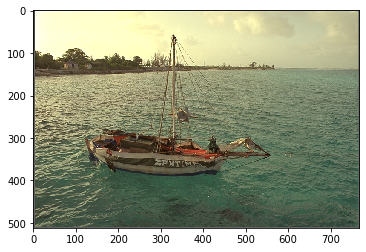

In [1]:
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt
%matplotlib inline
import mpld3
mpld3.enable_notebook()

# Read Images 
import cv2
im_bgr = cv2.imread("kodim06.png")
im = cv2.cvtColor(im_bgr, cv2.COLOR_BGR2RGB)
  
# Output Images
plt.imshow(im)

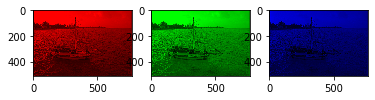

In [2]:
r = im.copy()
r[:, :, 1] = 0
r[:, :, 2] = 0


g = im.copy()
g[:, :, 0] = 0
g[:, :, 2] = 0

b = im.copy()
b[:, :, 0] = 0
b[:, :, 1] = 0

fig = plt.figure()
fig.add_subplot(1, 3, 1)
plt.imshow(r)
fig.add_subplot(1, 3, 2)
plt.imshow(g)
fig.add_subplot(1, 3, 3)
plt.imshow(b)

plt.show()

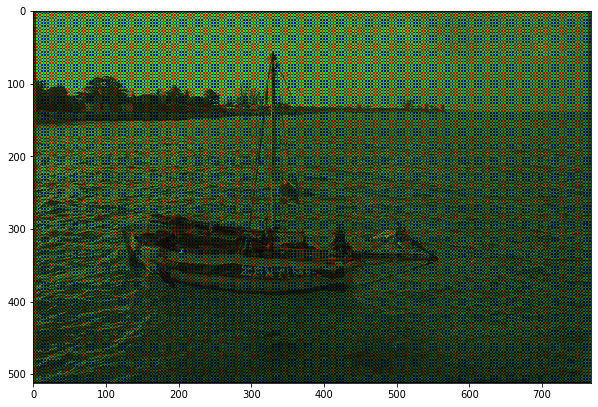

In [3]:
import numpy as np

bayer_filter = np.array([   # Bayer:
    [[1, 0, 0], [0, 1, 0]], # R G
    [[0, 1, 0], [0, 0, 1]], # G B
])

def im2cfa(im, cfa_filter):
    imshape = im.shape
    cfa = im.copy()
    filtershape = cfa_filter.shape
    for x in range(0, imshape[0]):
        for y in range(0, imshape[1]):
            rgb = cfa[x, y]
            f = cfa_filter[x % filtershape[0], y % filtershape[1]]
            cfa[x, y] = rgb * f
    return cfa

plt.rcParams["figure.figsize"]=10,10
plt.imshow(im2cfa(im, bayer_filter), interpolation='nearest')

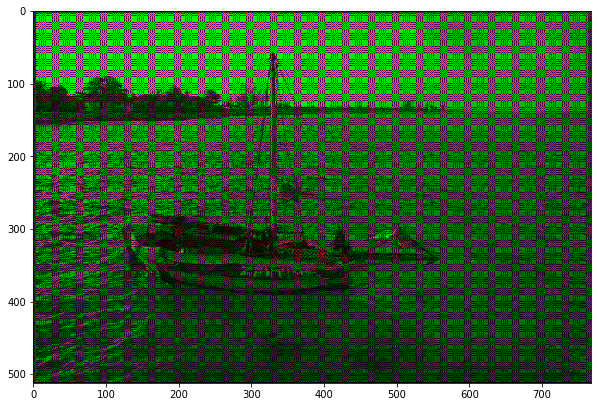

In [4]:
xtrans_filter = np.array([                                              # X-Trans:
    [[1, 0, 0], [0, 0, 1], [0, 1, 0], [0, 0, 1], [1, 0, 0], [0, 1, 0]], # R B G B R G
    [[0, 1, 0], [0, 1, 0], [1, 0, 0], [0, 1, 0], [0, 1, 0], [0, 0, 1]], # G G R G G B
    [[0, 1, 0], [0, 1, 0], [0, 0, 1], [0, 1, 0], [0, 1, 0], [1, 0, 0]], # G G B G G R
    [[0, 0, 1], [1, 0, 0], [0, 1, 0], [1, 0, 0], [0, 0, 1], [0, 1, 0]], # B R G R B G
    [[0, 1, 0], [0, 1, 0], [0, 0, 1], [0, 1, 0], [0, 1, 0], [1, 0, 0]], # G G B G G R
    [[0, 1, 0], [0, 1, 0], [1, 0, 0], [0, 1, 0], [0, 1, 0], [0, 0, 1]], # G G R G G B
])

plt.rcParams["figure.figsize"]=10,10
plt.imshow(im2cfa(im, xtrans_filter), interpolation='nearest')

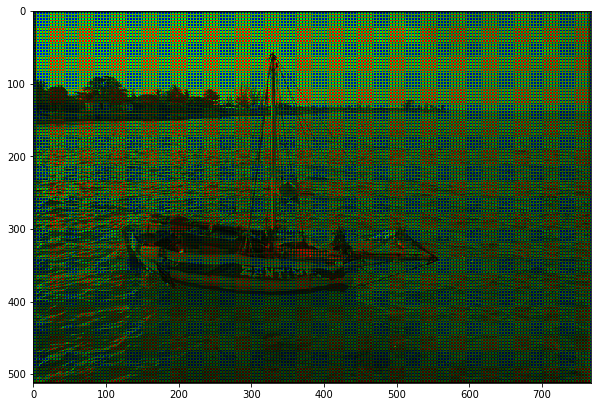

In [5]:
quadbayer_filter = np.array([                     # Quad-Bayer:
    [[1, 0, 0], [1, 0, 0], [0, 1, 0], [0, 1, 0]], # R R G G
    [[1, 0, 0], [1, 0, 0], [0, 1, 0], [0, 1, 0]], # R R G G
    [[0, 1, 0], [0, 1, 0], [0, 0, 1], [0, 0, 1]], # G G B B
    [[0, 1, 0], [0, 1, 0], [0, 0, 1], [0, 0, 1]], # G G B B
])

plt.rcParams["figure.figsize"]=10,10
plt.imshow(im2cfa(im, quadbayer_filter), interpolation='nearest')